Rianur Rahman

In [1]:
import numpy as np
import scipy as sp
from scipy import io
import cv2 as cv 
import matplotlib.pyplot as plt
import pylab
import os # for reading all files in a folder
#pylab.rcParams['figure.figsize'] = (12.0, 10.0)

# Condensation 7c

You'll have to call the code below four times (once each with 'll','lr', 'ul', 'ur': lower left, lower right, upper left, ipper right). For each time you'll get an estimated track (2D locations over time) of one of the corners of the pattern moved. Note that we're saving off the single MAP estimate at each frame, but the particles in the Particle Filter are attempting to keep track of the whole posterior distribution. 

Most TO DO parts below should be copy-paste from Practical9a and Practical9b.

computeLikelihood has been modified from its previous versions to cope with these particular gray-scale images.


Qustions you could ask yourself (not a TO DO): 
- Can you find a pattern between the movement of the particles and the movement of the camera relative to the scene?
- When is the MAP estimate especially good/bad?
- What is the relationship to the amount of noise? (--> experiment with different levels!)
- Why do different numbers of particles lead to very differenet results (for example 50 vs. 2000)? 

In [2]:
#Likelihood function is simple patch similarity

def computeLikelihood(image, template):
    #opencv's available methods - experiment with these
    #careful what range the output is!
    methods = [cv.TM_CCOEFF, cv.TM_CCOEFF_NORMED, cv.TM_CCORR,
            cv.TM_CCORR_NORMED, cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
    
    likelihood = cv.matchTemplate(image[:,:,2], template, methods[0])
    # (You can also try converting the image to greyscale instead of using the third channel as above with 
    # cv.cvtColor(image, cv.COLOR_BGR2GRAY))
    
    #we can pad to make this the size of the input image (for easier indexing)   
    pad_first = int(template.shape[0])
    pad_second = int(template.shape[1])
    pad_amounts = ((0, pad_first-1), (0, pad_second-1))
    likelihood = np.pad(likelihood, pad_amounts, 'constant')
    likelihood[likelihood<0] = 0 # to avoid negative weights 
    
    # apply a 10x10 averaging filter for stability. You can experiment with different sizes. 
    kernel = np.ones((10,10),np.float32)/100
    smoothed = cv.filter2D(likelihood,-1,kernel) 
    return smoothed 

In [3]:

def HW2_Practical7c(corner, plotRate=10):
    template = sp.io.loadmat(corner+'.mat')['pixelsTemplate']
    #let's show the template
    print('We are matching this template with shape: ', template.shape)
    plt.imshow(template)
    plt.show()

    # Load all images in folder
    images = []
    iFrame = 0
    folder = 'Pattern01/'
    lst = os.listdir(folder)
    lst.sort()

    for frameNum in lst:
        images.append(cv.imread(folder+frameNum))
        iFrame += 1
    # plot first image 
    plt.imshow(images[0])
    plt.show()

    imgHeight, imgWidth, colors = images[0].shape
    numParticles = 2000;
    weight_of_samples = np.ones((numParticles,1))

    # TODO: normalize the weights (may be trivial this time) [done]
    #weight_of_samples = weight_of_samples #replace this
    weight_of_samples = weight_of_samples/np.sum(weight_of_samples);

    # Initialize which samples from "last time" we want to propagate: all of
    # them!:
    samples_to_propagate = range(0, numParticles)


    # ============================
    # NOT A TODO: You don't need to change the code below, but eventually you may
    # want to vary the number of Dims (compare for example to lab 9b) 
    numDims_w = 2;
    #change
    #numDims_w = 4;
    # Here we randomly initialize some particles throughout the space of w:
    particles_old = np.random.rand(numParticles, numDims_w)
    particles_old[:,0] = particles_old[:,0] * imgHeight
    particles_old[:,1] = particles_old[:,1] * imgWidth

    # ============================

    #Initialize a temporary array r to store the per-frame MAP estimate of w. This is what we'll return in the end.
    r = np.zeros((iFrame, numDims_w));

    for iTime in range(iFrame):
        print('Processing Frame', iTime)
        # TODO: compute the cumulative sume of the weights. [done]
        #cum_hist_of_weights = np.linspace(0, 1, numParticles) # replace this
        cum_hist_of_weights =  np.cumsum(weight_of_samples);
        #print(weight_of_samples)


        # ==============================================================
        # Resample the old distribution at time t-1, and select samples, favoring
        # those that had a higher posterior probability.
        # ==============================================================
        samples_to_propagate = np.zeros(numParticles, dtype=np.int32)

        # Pick random thresholds in the cumulative probability's range [0,1]:
        some_threshes = np.random.rand(numParticles)


        # For each random threshold, find which sample in the ordered set is
        # the first one to push the cumulative probability above that
        # threshold, e.g. if the cumulative histogram goes from 0.23 to 0.26
        # between the 17th and 18th samples in the old distribution, and the
        # threshold is 0.234, then we'll want to propagate the 18th sample's w
        # (i.e. particle #18).

        for sampNum in range(numParticles): 
            thresh = some_threshes[sampNum]
            for index in range (numParticles):
                if cum_hist_of_weights[index] > thresh:
                    break
            samples_to_propagate[sampNum] = index

        # Note: it's ok if some of the old particles get picked repeatedly, while
        # others don't get picked at all.


        # =================================================
        # Visualize if you want
        # =================================================
        #plt.title('Cumulative histogram of probabilities for sorted list of particles')
        #plt.plot(np.zeros(numParticles), some_threshes,'b.')
        #plt.plot(range(0, numParticles), cum_hist_of_weights, 'rx-')
        #which_sample_ids = np.unique(samples_to_propagate)
        #how_many_of_each = np.bincount(np.ravel(samples_to_propagate))
        #for k in range(len(which_sample_ids)):
        #    plt.plot(which_sample_ids[k], 0, 'bo-', markersize = 3 * how_many_of_each[k], markerfacecolor='white')
        #plt.xlabel('Indeces of all available samples, with larger blue circles for frequently re-sampled particles\n(Iteration %01d)' % iTime)
        #plt.ylabel('Cumulative probability');
        #plt.show()
        # =================================================
        # =================================================

        # Predict where the particles we sampled from the old distribution of 
        # state-space will go in the next time-step. This means we have to apply 
        # the motion model to each old sample.
        particles_new = np.zeros_like(particles_old)
        for particleNum in range(numParticles):
            # TODO: Incorporate some noise, e.g. Gaussian noise with std 20,
            # into the current location (particles_old), to give a Brownian
            # motion model.
            particles_new[particleNum, :] =  particles_old[samples_to_propagate[particleNum], :] + np.random.normal(0,20, (numDims_w))  
            #change
            #noisePosition = np.random.normal(0,10, (1,2));
            #noiseVelocity = np.random.normal(0,10, (1,2));
        
            #particles_new[particleNum, 2:] = particles_old[samples_to_propagate[particleNum], 2:] + noiseVelocity; #replace this
        
            #particles_new[particleNum, :2] = particles_old[samples_to_propagate[particleNum], :2] + particles_old[samples_to_propagate[particleNum], 2:] + noisePosition; #replace this
            #particles_new[particleNum, :2] = np.round(particles_new[particleNum, :2]) # Round the particles_new to simplify Likelihood evaluation.

        # TODO: Not initially, but change the motion model above to have
        # different degrees of freedom, and optionally completely different
        # motion models. See Extra Credit for more instructions.

        #calculate likelihood function
        likelihood = computeLikelihood(images[iTime], template)

        if(iTime%plotRate==0):
            #plot results
            f, axarr = plt.subplots(1, 2)
            axarr[0].imshow(images[iTime])
            axarr[0].set_title('Particles')
            # now draw the particles onto the image
            axarr[0].plot(particles_new[:,1]+template.shape[1]/2, particles_new[:,0]+template.shape[0]/2, 'rx')

            #plot the likelihood
            axarr[1].imshow(likelihood)
            axarr[1].set_title('Likelihood')





        # From here we incorporate the data for the new state (time t):
        # The new particles accompanying predicted locations in state-space
        # for time t, are missing their weights: how well does each particle
        # explain the observations x_t?
        for particleNum in range(numParticles):

            # Convert the particle from state-space w to measurement-space x:
            # Note: that step is trivial here since both are in 2D space of image
            # coordinates

            # Within the loop, we evaluate the likelihood of each particle:
            particle = particles_new[particleNum, :]
            # Check that the predicted location is a place we can really evaluate
            # the likelihood.
            inFrame = particle[0] >= 0.0 and  particle[0] <= imgHeight and particle[1] >= 0.0 and particle[1] <= imgWidth
            if inFrame:
                minX = particle[1]
                minY = particle[0]

                weight_of_samples[particleNum] = likelihood[int(minY), int(minX)]

            else:
                weight_of_samples[particleNum] = 0.0

        # TODO: normalize the weights [done]
        weight_of_samples = weight_of_samples/np.sum(weight_of_samples); # replace this
        
        # find the location of the particle with highest weight
        indices = np.argsort(weight_of_samples,0)
        bestScoringParticles = particles_new[np.squeeze(indices[-15:]), :]
        if(iTime%plotRate==0):
            plt.plot(bestScoringParticles[-1:,1], bestScoringParticles[-1:,0], 'rx')
        # Return the MAP of middle position. Add template.shape/2 because matchTemplate finds the position of the upper left corner 
        # of the template. We want to plot the centre of the template. 
        r[iTime,:] = bestScoringParticles[-1,1]+template.shape[1]/2,bestScoringParticles[-1,0]+template.shape[0]/2
        print(r[iTime,:]) 
        if(iTime%plotRate==0):  
            plt.show()

            #print the original image and the position of the tracked corner.
            plt.imshow(images[iTime])
            plt.plot(r[iTime,0],r[iTime,1],'rx')
            plt.show()
        # Now we're done updating the state for time t. 
        # For Condensation, just clean up and prepare for the next round of 
        # predictions and measurements:
        particles_old = particles_new

    return r

I was having memory and rendering issues thus I added the variable plotRate which by default is set to 10, and decides how often (every how many frames) we plot the results. This can be set to 1 to display all the plots or a higher number to plot the results less often

We are matching this template with shape:  (25, 28)


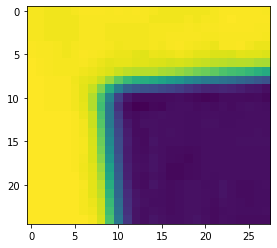

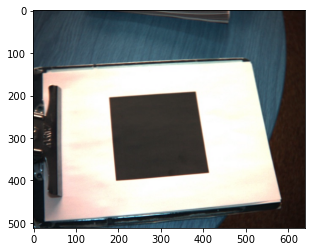

Processing Frame 0
[192.10293392 208.96396891]


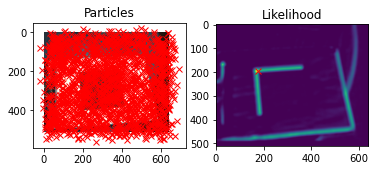

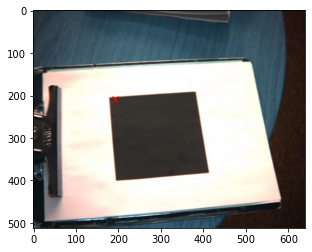

Processing Frame 1
[182.34099983 213.06055555]
Processing Frame 2
[185.27757037 211.13763282]
Processing Frame 3
[187.32717575 211.19727803]
Processing Frame 4
[191.84863982 210.80556928]
Processing Frame 5
[190.57148756 212.02371324]
Processing Frame 6
[191.37228517 210.93893668]
Processing Frame 7
[194.2957334  208.96456139]
Processing Frame 8
[195.52328614 210.95220184]
Processing Frame 9
[198.25556185 210.96808365]
Processing Frame 10
[195.48081891 211.50452279]


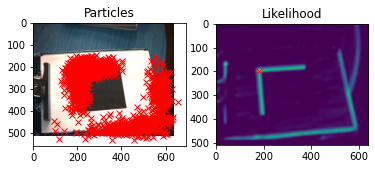

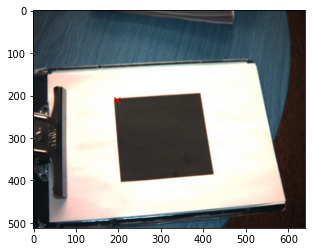

Processing Frame 11
[196.59331553 212.77351046]
Processing Frame 12
[194.24803347 215.36121807]
Processing Frame 13
[196.62029418 210.52841916]
Processing Frame 14
[202.8348989  201.04972989]
Processing Frame 15
[207.09087391 196.47078976]
Processing Frame 16
[211.39118519 192.66753059]
Processing Frame 17
[211.37679954 190.82572376]
Processing Frame 18
[217.05893075 189.90962733]
Processing Frame 19
[222.52768552 189.73773925]
Processing Frame 20
[224.70992449 192.24929509]


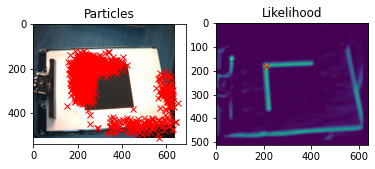

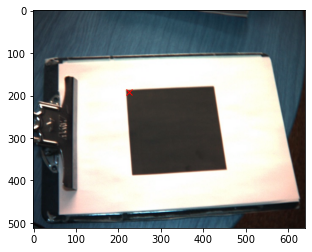

Processing Frame 21
[228.89835818 194.08967473]
Processing Frame 22
[232.15966356 198.08155055]
Processing Frame 23
[237.71308827 198.32133378]
Processing Frame 24
[242.1324046  198.35948684]
Processing Frame 25
[245.72210812 198.96790988]
Processing Frame 26
[250.67675523 197.86185283]
Processing Frame 27
[255.57760825 195.7449382 ]
Processing Frame 28
[266.1122289  193.83526746]
Processing Frame 29
[271.52973593 195.88258778]
Processing Frame 30
[274.72673746 200.0036634 ]


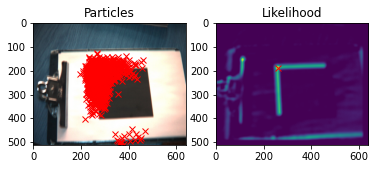

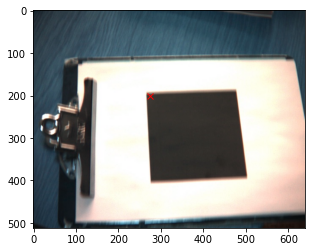

Processing Frame 31
[272.57226979 207.87969966]
Processing Frame 32
[271.62106367 214.59987568]
Processing Frame 33
[271.69890098 221.03137116]
Processing Frame 34
[269.30599953 223.59057228]
Processing Frame 35
[259.25705329 228.38479701]
Processing Frame 36
[251.39223127 224.57505518]
Processing Frame 37
[240.6109712  219.13128649]
Processing Frame 38
[220.25751118 215.90487334]
Processing Frame 39
[205.35556864 220.73119957]
Processing Frame 40
[186.23431288 230.19499338]


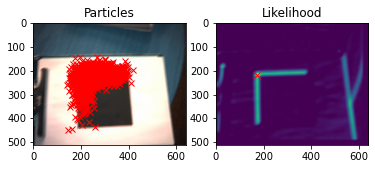

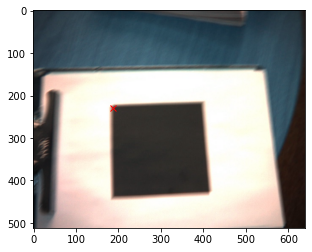

Processing Frame 41
[178.05240852 237.95751159]
Processing Frame 42
[173.02519049 249.28440096]
Processing Frame 43
[163.63391606 262.13798   ]
Processing Frame 44
[159.62701128 271.27928629]
Processing Frame 45
[158.02836249 278.99541764]
Processing Frame 46
[159.66118188 281.84304431]
Processing Frame 47
[162.2349352 279.8523416]
Processing Frame 48
[162.38710107 275.22771107]
Processing Frame 49
[163.75857612 265.06117132]
Processing Frame 50
[167.86019664 257.11003095]


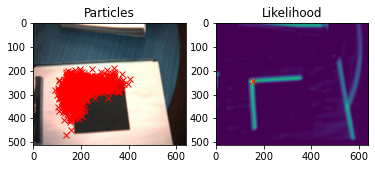

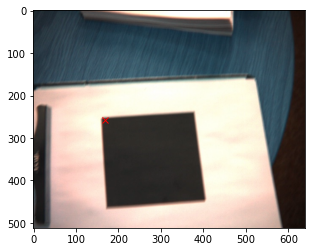

Processing Frame 51
[170.14344006 248.69374852]
Processing Frame 52
[170.63883461 249.13686607]
Processing Frame 53
[168.13876776 250.5543471 ]
Processing Frame 54
[168.41782534 258.21502934]
Processing Frame 55
[163.17196131 262.04326718]
Processing Frame 56
[161.66560447 258.95750191]
Processing Frame 57
[161.78291333 251.19263926]
Processing Frame 58
[161.11156951 241.19686514]
Processing Frame 59
[161.78008636 231.13503329]
Processing Frame 60
[160.83755713 215.14391487]


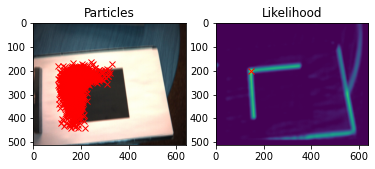

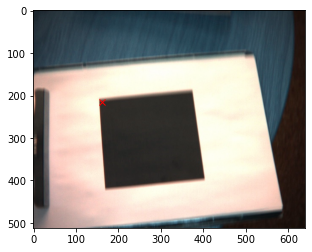

Processing Frame 61
[161.29172085 204.57752086]
Processing Frame 62
[161.52630261 201.04490323]
Processing Frame 63
[158.74288959 199.60667319]
Processing Frame 64
[157.61257943 198.68693509]
Processing Frame 65
[159.04546673 195.91505044]
Processing Frame 66
[156.48347733 195.90020276]
Processing Frame 67
[156.01227434 195.43873257]
Processing Frame 68
[154.81681088 193.30594806]
Processing Frame 69
[154.83490869 190.96944781]
Processing Frame 70
[154.95246258 188.76755322]


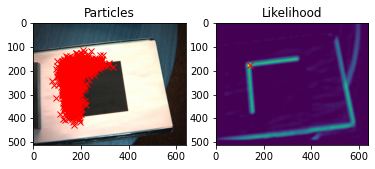

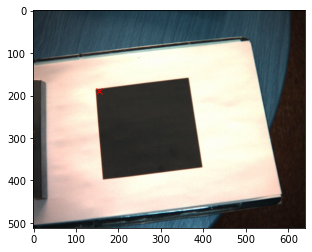

Processing Frame 71
[152.46498292 188.87861583]
Processing Frame 72
[155.12819359 187.40002784]
Processing Frame 73
[155.87924882 188.41594185]
Processing Frame 74
[157.95249001 189.0063663 ]
Processing Frame 75
[159.5337603  194.47673874]
Processing Frame 76
[165.46794519 198.80307297]
Processing Frame 77
[180.01348866 194.57399619]
Processing Frame 78
[194.45959156 187.06172154]
Processing Frame 79
[199.5494064  182.21686517]
Processing Frame 80
[204.04220094 170.1674256 ]


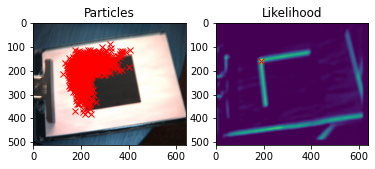

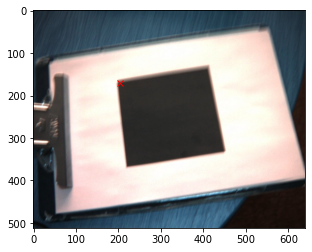

Processing Frame 81
[206.27277558 163.46457496]
Processing Frame 82
[205.29951206 161.09994203]
Processing Frame 83
[203.42105086 158.3248417 ]
Processing Frame 84
[205.46594905 155.74041179]
Processing Frame 85
[204.68924576 154.02578818]
Processing Frame 86
[202.60346418 156.22740642]
Processing Frame 87
[194.1145511  156.99847209]
Processing Frame 88
[192.95878523 154.1253069 ]
Processing Frame 89
[187.99062704 151.72935182]
Processing Frame 90
[185.96176601 152.22225308]


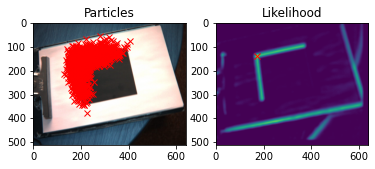

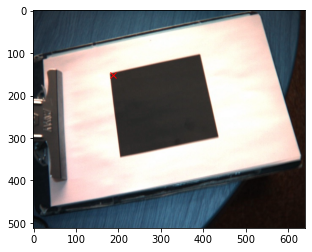

Processing Frame 91
[186.49496312 151.14775967]
Processing Frame 92
[186.98304894 149.95239443]
Processing Frame 93
[187.17449373 147.02914941]
Processing Frame 94
[189.8493129  145.20652192]
Processing Frame 95
[188.61232163 144.56398356]
Processing Frame 96
[186.1838215  147.44602681]
Processing Frame 97
[175.26080985 157.85297975]
Processing Frame 98
[165.52045421 165.20488741]
Processing Frame 99
[159.35317873 169.56685187]
Processing Frame 100
[154.40663734 183.56803544]


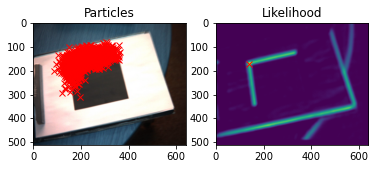

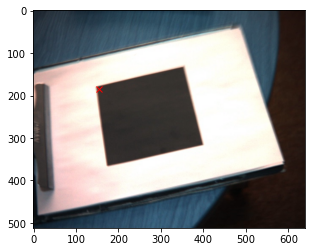

Processing Frame 101
[149.9603427  180.86957603]
Processing Frame 102
[147.47487905 181.67515061]
Processing Frame 103
[149.39800082 172.70454659]
Processing Frame 104
[151.60152981 168.02731876]
Processing Frame 105
[142.20115579 166.60843522]
Processing Frame 106
[144.31563053 159.68477418]
Processing Frame 107
[147.72680416 155.70653465]
Processing Frame 108
[144.15902453 155.17334595]
Processing Frame 109
[143.80426903 155.06275223]
Processing Frame 110
[136.11757625 156.07622101]


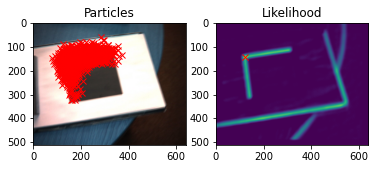

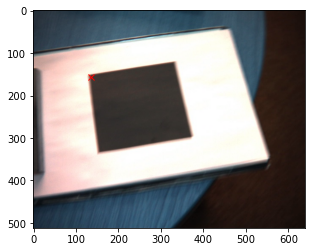

Processing Frame 111
[130.57309837 165.34826937]
Processing Frame 112
[127.07628372 171.70704689]
Processing Frame 113
[121.07882676 175.12157242]
Processing Frame 114
[125.41825968 178.7467967 ]
Processing Frame 115
[128.32631367 183.13418068]
Processing Frame 116
[132.88345488 182.58282396]
Processing Frame 117
[139.20899991 187.05115365]
Processing Frame 118
[142.48854829 186.91706438]
Processing Frame 119
[152.45592774 183.7755053 ]
Processing Frame 120
[158.11363689 185.37660418]


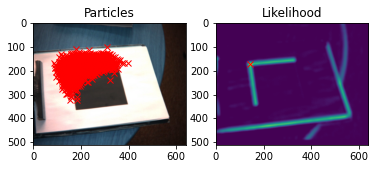

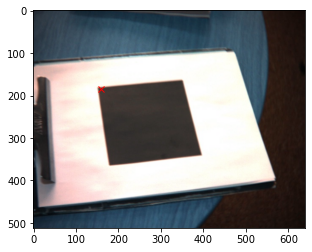

Processing Frame 121
[162.91472216 186.94011967]
Processing Frame 122
[165.83329384 183.01324744]
Processing Frame 123
[168.2054985  178.13395384]
Processing Frame 124
[163.18242873 180.55939498]
Processing Frame 125
[161.21811832 180.31054664]
Processing Frame 126
[165.63784518 178.07004136]
Processing Frame 127
[171.88239805 174.82445012]
Processing Frame 128
[173.93128499 176.1772952 ]
Processing Frame 129
[177.6970942  177.10977422]
Processing Frame 130
[173.24702468 182.56606637]


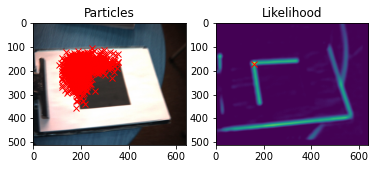

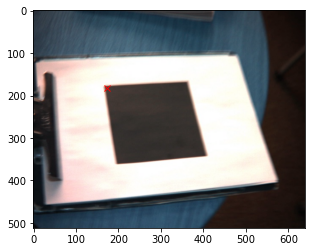

Processing Frame 131
[163.80890131 183.28586982]
Processing Frame 132
[156.18013961 172.59857804]
Processing Frame 133
[157.00184463 162.43185298]
Processing Frame 134
[154.5774656  156.37843906]
Processing Frame 135
[154.69574761 151.12362635]
Processing Frame 136
[157.00174919 144.15875457]
Processing Frame 137
[160.01181075 139.28527176]
Processing Frame 138
[159.43724086 137.22572383]
Processing Frame 139
[165.31194721 135.90994355]
Processing Frame 140
[168.1567546  131.35432639]


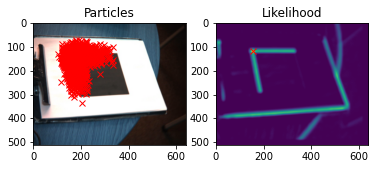

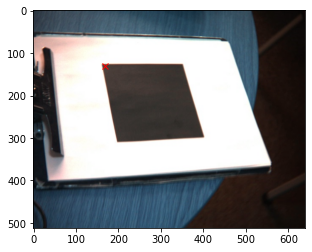

Processing Frame 141
[167.57739104 135.36453495]
Processing Frame 142
[167.18620113 131.71763996]
Processing Frame 143
[160.66353368 131.43378654]
Processing Frame 144
[155.39122018 134.99356648]
Processing Frame 145
[148.05823579 132.70787862]
Processing Frame 146
[146.91658536 123.32670505]
Processing Frame 147
[139.15145099 132.20093711]
Processing Frame 148
[134.63061618 135.04230079]
Processing Frame 149
[135.2510085  138.27318176]
Processing Frame 150
[134.41640558 135.02827216]


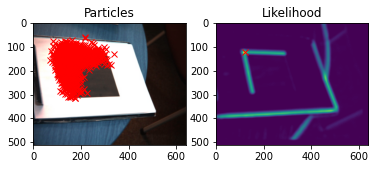

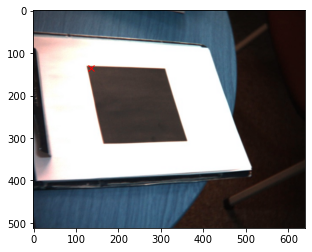

In [4]:
r_ul = HW2_Practical7c('ul')

We are matching this template with shape:  (25, 28)


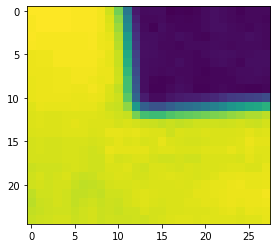

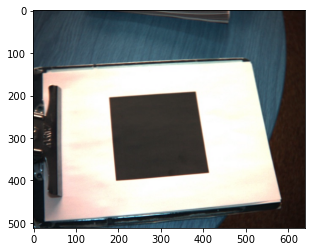

Processing Frame 0
[563.56789634 350.81351794]


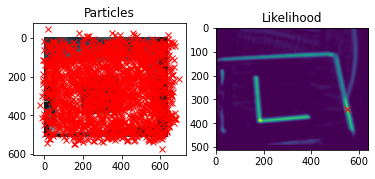

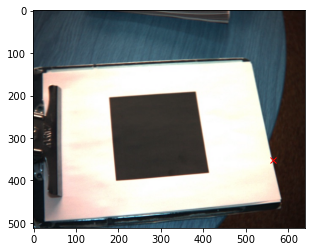

Processing Frame 1
[204.39760946 399.63294799]
Processing Frame 2
[200.68023443 405.0955756 ]
Processing Frame 3
[203.11822789 402.73291579]
Processing Frame 4
[203.57071501 402.42309897]
Processing Frame 5
[205.49977042 400.96042566]
Processing Frame 6
[206.63898536 400.37048292]
Processing Frame 7
[209.75396939 399.98116553]
Processing Frame 8
[208.89979918 400.91058404]
Processing Frame 9
[211.85119027 400.6340372 ]
Processing Frame 10
[210.09719995 403.60319101]


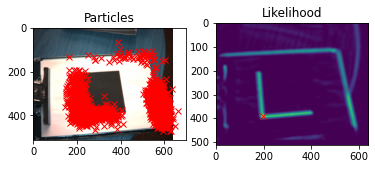

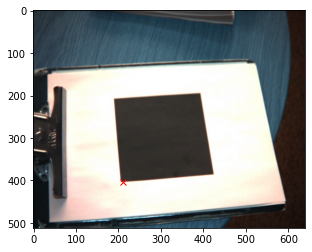

Processing Frame 11
[207.78217117 402.75747087]
Processing Frame 12
[211.99738101 403.93824425]
Processing Frame 13
[212.1737883  398.68015614]
Processing Frame 14
[219.75572    389.67577543]
Processing Frame 15
[222.79233707 385.89568689]
Processing Frame 16
[225.53614365 382.70219893]
Processing Frame 17
[227.98384432 384.83212502]
Processing Frame 18
[231.58771003 382.45713697]
Processing Frame 19
[235.03787583 384.16757974]
Processing Frame 20
[236.86259023 388.38267082]


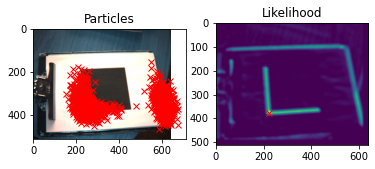

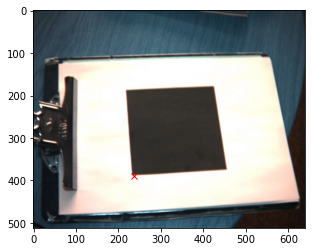

Processing Frame 21
[239.05505689 389.97232984]
Processing Frame 22
[242.25990884 394.75351755]
Processing Frame 23
[250.13977062 393.70122308]
Processing Frame 24
[253.90805528 395.7359816 ]
Processing Frame 25
[256.61482178 397.29096015]
Processing Frame 26
[262.66510364 395.61337197]
Processing Frame 27
[271.59240638 392.74339833]
Processing Frame 28
[277.06973129 392.84542037]
Processing Frame 29
[280.39957092 396.12513891]
Processing Frame 30
[280.14818977 404.45271278]


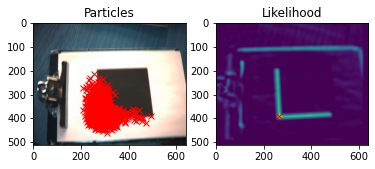

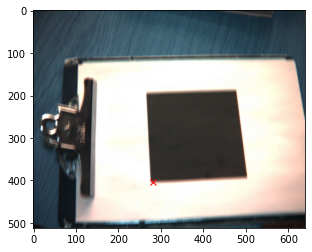

Processing Frame 31
[280.84135607 414.00912228]
Processing Frame 32
[277.40983737 419.17404257]
Processing Frame 33
[276.74401296 426.1331421 ]
Processing Frame 34
[272.42652174 431.96199923]
Processing Frame 35
[262.84924377 433.36756764]
Processing Frame 36
[254.7764717  429.38377353]
Processing Frame 37
[241.43667232 426.32406192]
Processing Frame 38
[220.84794316 424.4526144 ]
Processing Frame 39
[207.51916135 433.19047682]
Processing Frame 40
[193.68695268 441.01484138]


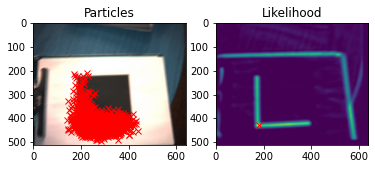

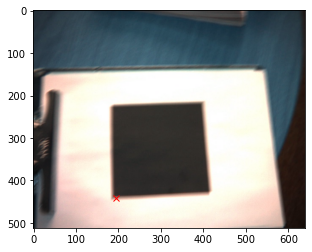

Processing Frame 41
[186.9402741  448.29236339]
Processing Frame 42
[177.80972622 460.20113175]
Processing Frame 43
[168.97983711 472.77348174]
Processing Frame 44
[165.55686866 482.14526361]
Processing Frame 45
[166.51822804 493.31937071]
Processing Frame 46
[170.38619627 490.11371214]
Processing Frame 47
[170.68385095 488.31711645]
Processing Frame 48
[170.31178598 481.74291161]
Processing Frame 49
[173.55958563 472.67867451]
Processing Frame 50
[177.57584911 463.15535576]


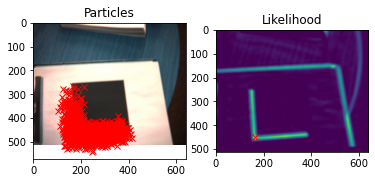

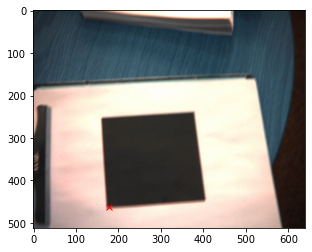

Processing Frame 51
[182.5314735  456.58137483]
Processing Frame 52
[178.6729497  459.21984184]
Processing Frame 53
[178.99096066 462.51581221]
Processing Frame 54
[176.27735926 466.83609158]
Processing Frame 55
[172.89132382 469.58794493]
Processing Frame 56
[171.04683898 466.35337208]
Processing Frame 57
[173.78746395 456.50548013]
Processing Frame 58
[172.33247636 446.23561536]
Processing Frame 59
[173.60551163 429.89208834]
Processing Frame 60
[174.48272903 418.67674419]


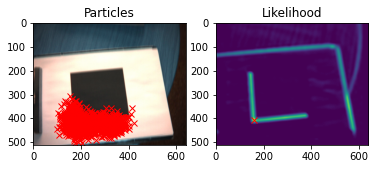

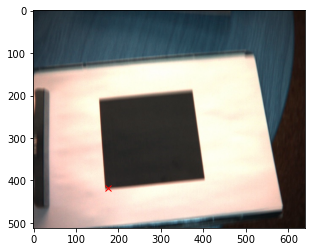

Processing Frame 61
[173.15796819 413.08819277]
Processing Frame 62
[172.75631342 409.74278021]
Processing Frame 63
[171.40932028 409.35312195]
Processing Frame 64
[172.51385117 406.49839187]
Processing Frame 65
[172.90977779 406.38694859]
Processing Frame 66
[169.9676412  402.77572793]
Processing Frame 67
[168.58216336 401.95294458]
Processing Frame 68
[168.51420219 401.56026792]
Processing Frame 69
[169.96531611 397.79744935]
Processing Frame 70
[168.78265635 397.48714329]


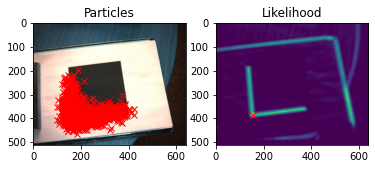

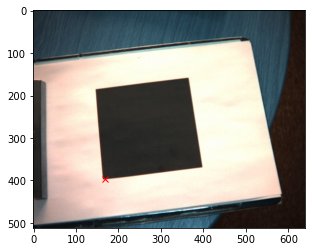

Processing Frame 71
[168.80107527 394.60323921]
Processing Frame 72
[169.69830106 391.84409955]
Processing Frame 73
[171.46285487 392.85653542]
Processing Frame 74
[174.22560932 395.37010992]
Processing Frame 75
[175.70882011 399.51638501]
Processing Frame 76
[184.08838328 402.4834378 ]
Processing Frame 77
[203.45421185 396.00936085]
Processing Frame 78
[213.4679025  387.94047995]
Processing Frame 79
[218.58499478 379.98024504]
Processing Frame 80
[224.0377347  368.29090897]


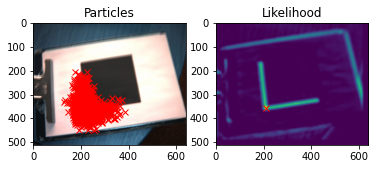

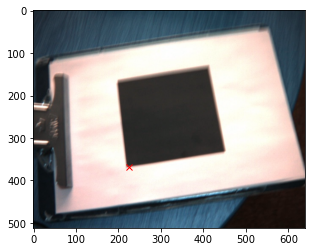

Processing Frame 81
[224.31899314 363.29937835]
Processing Frame 82
[224.43786783 359.76411104]
Processing Frame 83
[223.3911592  356.71762417]
Processing Frame 84
[224.30978321 353.56972702]
Processing Frame 85
[223.0825099  353.30372196]
Processing Frame 86
[219.94408718 353.69550033]
Processing Frame 87
[216.12078467 350.71243242]
Processing Frame 88
[211.27275547 348.32701311]
Processing Frame 89
[209.49305099 347.85449909]
Processing Frame 90
[208.69971439 345.26212695]


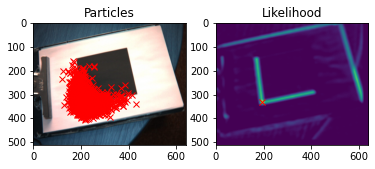

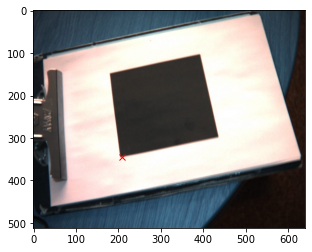

Processing Frame 91
[207.93630076 343.83333868]
Processing Frame 92
[209.76496327 338.57470525]
Processing Frame 93
[210.93625989 336.52994776]
Processing Frame 94
[210.82392393 333.59206327]
Processing Frame 95
[211.03527309 332.23168088]
Processing Frame 96
[208.34615868 340.36576745]
Processing Frame 97
[196.26088936 346.51615843]
Processing Frame 98
[187.43991039 349.43701648]
Processing Frame 99
[181.10794401 355.74601646]
Processing Frame 100
[175.44893679 365.61786779]


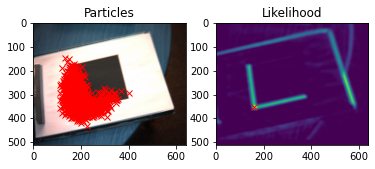

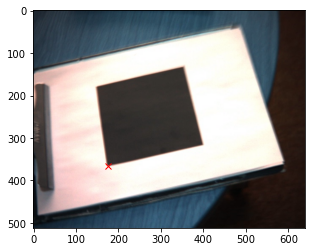

Processing Frame 101
[173.35197059 362.62447919]
Processing Frame 102
[168.48194912 357.86972669]
Processing Frame 103
[172.75028926 351.32386634]
Processing Frame 104
[172.23186544 347.23181404]
Processing Frame 105
[164.40050887 341.57049866]
Processing Frame 106
[169.69891489 337.88494665]
Processing Frame 107
[169.65378493 331.95313373]
Processing Frame 108
[167.99390582 331.79144047]
Processing Frame 109
[166.95602047 330.47486304]
Processing Frame 110
[156.76770598 333.17455316]


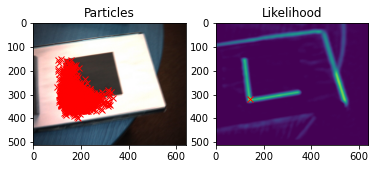

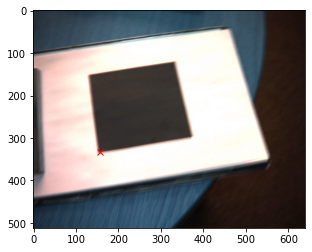

Processing Frame 111
[151.60421627 346.38141329]
Processing Frame 112
[144.48702895 351.43788847]
Processing Frame 113
[143.48243631 351.69533768]
Processing Frame 114
[149.34010646 356.49149509]
Processing Frame 115
[150.31305392 359.74728677]
Processing Frame 116
[156.48545953 360.41932059]
Processing Frame 117
[161.46652067 363.55585916]
Processing Frame 118
[167.44177217 363.35750332]
Processing Frame 119
[178.04718095 360.5260161 ]
Processing Frame 120
[182.50700807 362.98481506]


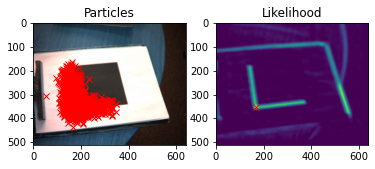

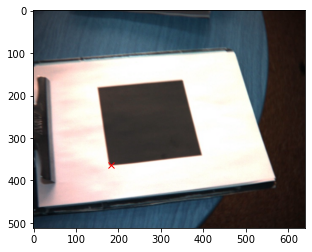

Processing Frame 121
[186.07572936 364.56387087]
Processing Frame 122
[190.31209012 360.07539178]
Processing Frame 123
[190.83520678 355.40633839]
Processing Frame 124
[186.43565197 360.08039289]
Processing Frame 125
[187.11375517 357.53803402]
Processing Frame 126
[195.00783179 354.92574861]
Processing Frame 127
[198.51454247 353.51893424]
Processing Frame 128
[203.72597105 355.72857029]
Processing Frame 129
[205.25711716 357.14707298]
Processing Frame 130
[198.3711639  362.19274959]


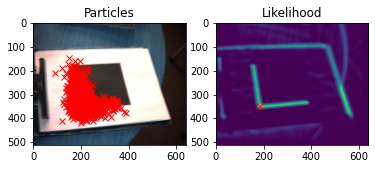

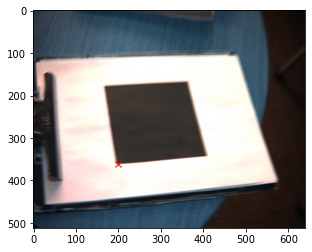

Processing Frame 131
[189.10022321 357.06819842]
Processing Frame 132
[186.09407564 346.19332191]
Processing Frame 133
[187.48568052 338.18977458]
Processing Frame 134
[184.91675389 331.38299432]
Processing Frame 135
[188.08171602 325.39206492]
Processing Frame 136
[190.30842256 322.17332217]
Processing Frame 137
[191.73604989 316.11163058]
Processing Frame 138
[191.06513218 313.80436033]
Processing Frame 139
[197.22537755 310.45739745]
Processing Frame 140
[201.34650768 309.6768618 ]


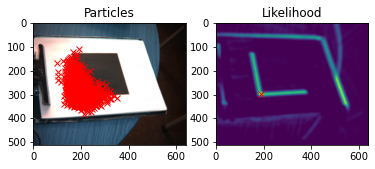

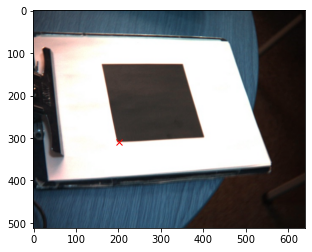

Processing Frame 141
[199.54349698 313.13823094]
Processing Frame 142
[197.67145926 307.72120001]
Processing Frame 143
[193.83991034 310.18874381]
Processing Frame 144
[187.61143123 314.26939129]
Processing Frame 145
[182.28600113 302.75335136]
Processing Frame 146
[177.63547561 301.86032519]
Processing Frame 147
[171.33995171 311.20447349]
Processing Frame 148
[166.45613915 314.88842222]
Processing Frame 149
[168.39893093 315.36190356]
Processing Frame 150
[168.45913744 313.55630283]


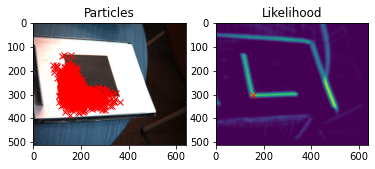

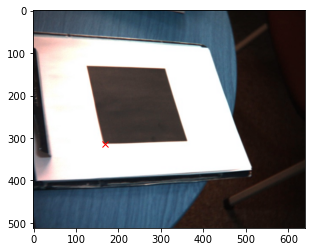

In [5]:
r_ll = HW2_Practical7c('ll')

We are matching this template with shape:  (29, 29)


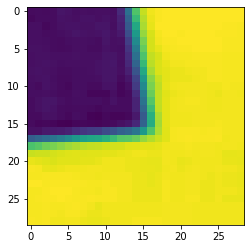

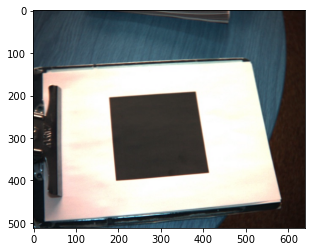

Processing Frame 0
[414.60163595 379.72507395]


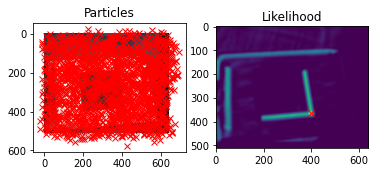

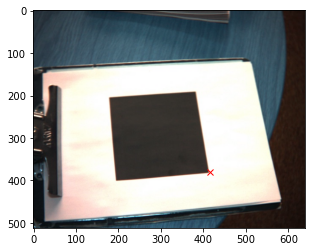

Processing Frame 1
[410.5690009  378.00983173]
Processing Frame 2
[414.13383199 381.40894395]
Processing Frame 3
[415.43943123 382.34435879]
Processing Frame 4
[417.64618593 383.34141009]
Processing Frame 5
[416.42903918 381.17248708]
Processing Frame 6
[421.00772276 379.84960957]
Processing Frame 7
[420.90552517 381.35498323]
Processing Frame 8
[422.62226383 381.84882058]
Processing Frame 9
[422.85176596 381.93260607]
Processing Frame 10
[422.78235435 382.50073328]


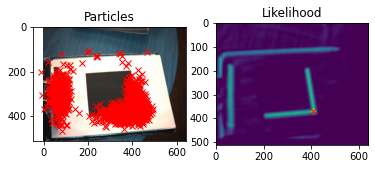

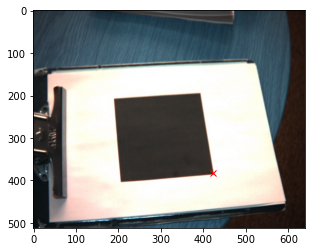

Processing Frame 11
[423.33043154 383.69731015]
Processing Frame 12
[421.98841677 383.85822548]
Processing Frame 13
[426.19505153 378.68786323]
Processing Frame 14
[431.4300478  370.95507925]
Processing Frame 15
[435.69941789 366.25936093]
Processing Frame 16
[438.61493292 365.30157937]
Processing Frame 17
[440.52481976 366.84653089]
Processing Frame 18
[447.69184671 366.39048248]
Processing Frame 19
[450.59725732 367.77883716]
Processing Frame 20
[455.4496656  370.54626442]


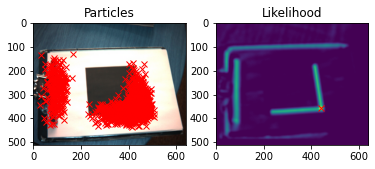

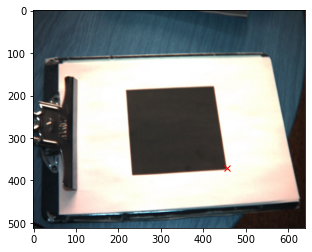

Processing Frame 21
[454.58474664 374.64282182]
Processing Frame 22
[461.17338795 379.79945889]
Processing Frame 23
[464.82852023 379.64288811]
Processing Frame 24
[471.02823259 382.55400782]
Processing Frame 25
[473.81393948 383.25381395]
Processing Frame 26
[480.94939831 381.76728873]
Processing Frame 27
[490.81914458 380.19344293]
Processing Frame 28
[496.28526455 380.07441719]
Processing Frame 29
[503.14463314 382.36365468]
Processing Frame 30
[501.92293807 389.98680655]


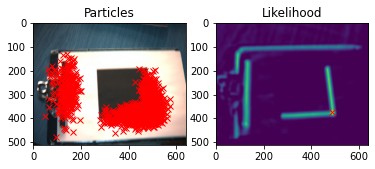

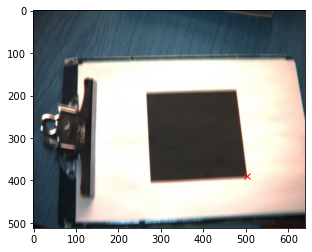

Processing Frame 31
[501.81887986 400.78054637]
Processing Frame 32
[502.28878353 406.79603927]
Processing Frame 33
[500.94628093 414.307953  ]
Processing Frame 34
[495.62952681 418.75433742]
Processing Frame 35
[487.49175464 419.9149589 ]
Processing Frame 36
[477.44504972 416.49483607]
Processing Frame 37
[462.41998026 412.96773565]
Processing Frame 38
[445.50436759 411.54513071]
Processing Frame 39
[429.85804007 418.29189923]
Processing Frame 40
[413.72336674 428.14186799]


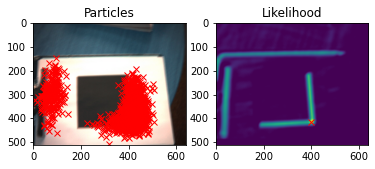

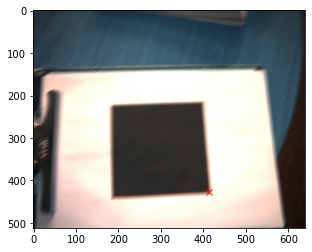

Processing Frame 41
[410.56220336 438.06445872]
Processing Frame 42
[400.56536868 446.93357714]
Processing Frame 43
[391.97101699 459.99582908]
Processing Frame 44
[392.10105127 468.53824978]
Processing Frame 45
[391.97344125 474.61884856]
Processing Frame 46
[396.22474225 475.90434161]
Processing Frame 47
[396.09690887 472.63576378]
Processing Frame 48
[397.05142831 462.67190742]
Processing Frame 49
[400.73076461 455.23797308]
Processing Frame 50
[405.31924489 446.62279695]


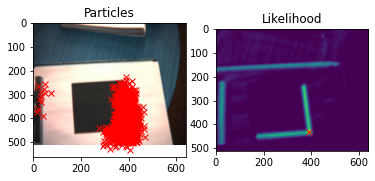

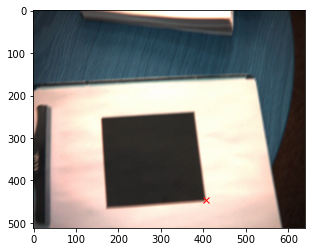

Processing Frame 51
[406.81131638 439.07376467]
Processing Frame 52
[405.8829393  439.63657831]
Processing Frame 53
[404.3179422  442.61285453]
Processing Frame 54
[402.65767335 448.01549502]
Processing Frame 55
[399.22400471 450.60224385]
Processing Frame 56
[400.26748978 445.42930023]
Processing Frame 57
[400.92386503 434.44361436]
Processing Frame 58
[402.22785664 422.89694252]
Processing Frame 59
[401.35601781 407.34545304]
Processing Frame 60
[402.05746477 396.22462729]


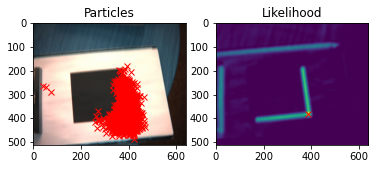

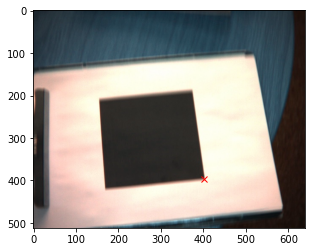

Processing Frame 61
[402.95643817 388.55871705]
Processing Frame 62
[401.57652423 384.47943926]
Processing Frame 63
[399.49760322 382.50495608]
Processing Frame 64
[400.47806685 380.10431841]
Processing Frame 65
[401.9024696  376.67590725]
Processing Frame 66
[397.53432234 377.85924324]
Processing Frame 67
[397.8912422  374.44717262]
Processing Frame 68
[397.80990031 372.24829117]
Processing Frame 69
[396.95276126 369.45733056]
Processing Frame 70
[395.45287985 368.80643979]


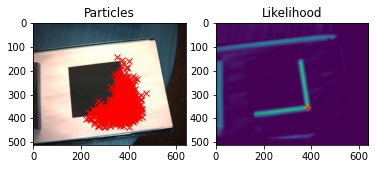

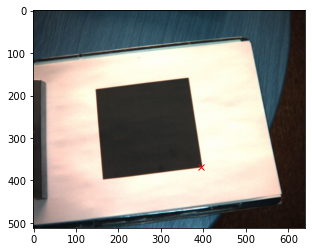

Processing Frame 71
[393.88697616 366.8128032 ]
Processing Frame 72
[396.58639905 363.09890415]
Processing Frame 73
[397.67889699 362.54220296]
Processing Frame 74
[401.06587863 364.31083381]
Processing Frame 75
[402.68331482 369.01327449]
Processing Frame 76
[410.10018127 370.03764688]
Processing Frame 77
[424.09865075 361.26251904]
Processing Frame 78
[438.06917905 353.28719505]
Processing Frame 79
[444.65171715 345.44445047]
Processing Frame 80
[448.77489786 331.3370097 ]


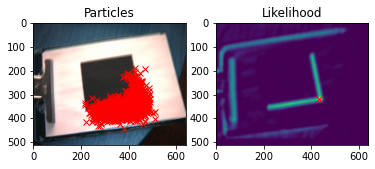

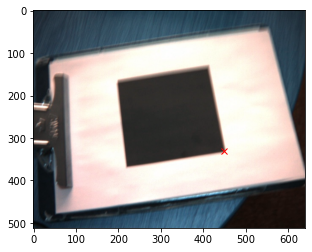

Processing Frame 81
[452.49581333 324.77064282]
Processing Frame 82
[449.87599499 321.68969616]
Processing Frame 83
[452.13508539 316.22824268]
Processing Frame 84
[451.55783261 312.73540992]
Processing Frame 85
[451.33823537 311.00972645]
Processing Frame 86
[445.72693607 311.07836205]
Processing Frame 87
[444.39820237 308.22830005]
Processing Frame 88
[438.15613574 302.27905218]
Processing Frame 89
[434.82052893 302.6556308 ]
Processing Frame 90
[434.33746703 297.47425053]


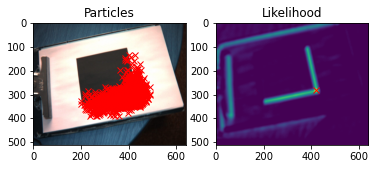

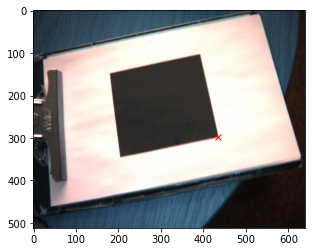

Processing Frame 91
[433.37777778 296.07666271]
Processing Frame 92
[433.66327055 291.38785224]
Processing Frame 93
[434.88537569 288.69365476]
Processing Frame 94
[435.06571735 284.56839448]
Processing Frame 95
[435.52753916 281.89658977]
Processing Frame 96
[429.71041115 286.89606846]
Processing Frame 97
[416.92128408 297.24041713]
Processing Frame 98
[408.55016769 297.35062557]
Processing Frame 99
[402.76736395 305.72281155]
Processing Frame 100
[396.51356228 316.60104808]


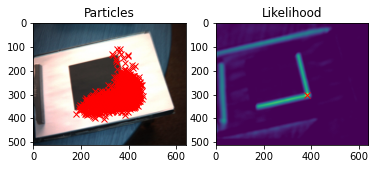

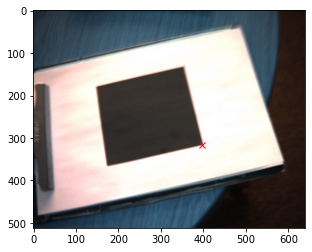

Processing Frame 101
[394.15233874 317.15062158]
Processing Frame 102
[388.5326328  317.00930679]
Processing Frame 103
[389.36839689 306.69042915]
Processing Frame 104
[389.68095029 302.77218039]
Processing Frame 105
[381.01857303 299.70252033]
Processing Frame 106
[387.49223586 296.5176499 ]
Processing Frame 107
[386.76559383 292.58840222]
Processing Frame 108
[383.79462864 293.68257315]
Processing Frame 109
[381.59986664 292.5263429 ]
Processing Frame 110
[372.75405028 296.5114286 ]


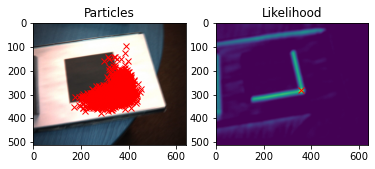

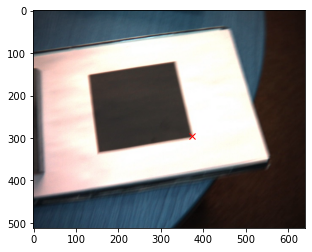

Processing Frame 111
[366.08454308 308.86474129]
Processing Frame 112
[359.80728574 315.67711331]
Processing Frame 113
[356.66320031 321.9523445 ]
Processing Frame 114
[361.18385227 325.33812817]
Processing Frame 115
[362.47525669 330.09862603]
Processing Frame 116
[369.87180065 334.41253729]
Processing Frame 117
[373.21252738 339.36580014]
Processing Frame 118
[377.76254953 336.94975051]
Processing Frame 119
[387.9231078  337.08553999]
Processing Frame 120
[396.02125103 339.858724  ]


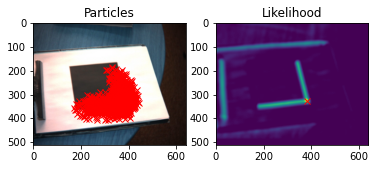

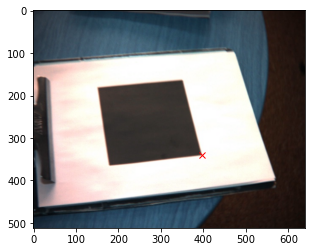

Processing Frame 121
[396.64366895 338.58154515]
Processing Frame 122
[401.04998746 337.15875727]
Processing Frame 123
[403.28098786 331.79852881]
Processing Frame 124
[397.3730695  337.31593402]
Processing Frame 125
[398.03124106 337.89310986]
Processing Frame 126
[405.04669407 333.13865865]
Processing Frame 127
[408.32034991 331.3272336 ]
Processing Frame 128
[410.85181281 333.77569188]
Processing Frame 129
[413.16913856 334.9966053 ]
Processing Frame 130
[405.82200237 339.87671451]


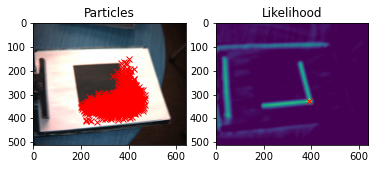

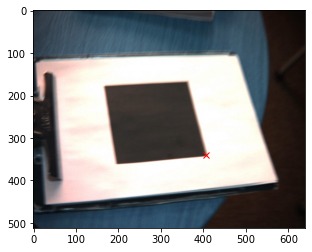

Processing Frame 131
[393.74343001 340.19040737]
Processing Frame 132
[390.45847945 327.93754208]
Processing Frame 133
[390.91562221 319.20817042]
Processing Frame 134
[390.41635942 313.93656584]
Processing Frame 135
[390.89422304 309.42770429]
Processing Frame 136
[393.27169889 304.73052157]
Processing Frame 137
[393.66091839 300.93375085]
Processing Frame 138
[392.10003718 300.3466799 ]
Processing Frame 139
[396.68722022 297.04835588]
Processing Frame 140
[399.22696118 295.68778461]


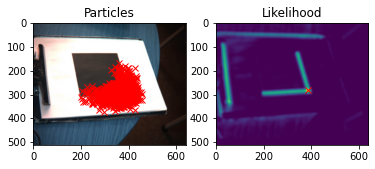

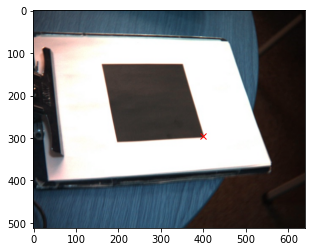

Processing Frame 141
[395.90899212 300.42348324]
Processing Frame 142
[395.22544562 297.95978478]
Processing Frame 143
[388.06030238 298.48830041]
Processing Frame 144
[382.29794725 300.85910779]
Processing Frame 145
[377.50939026 291.94720581]
Processing Frame 146
[368.98127263 291.68421744]
Processing Frame 147
[365.09736262 300.55839091]
Processing Frame 148
[360.75240153 304.04769021]
Processing Frame 149
[361.318682   306.14053015]
Processing Frame 150
[357.79527396 304.83904432]


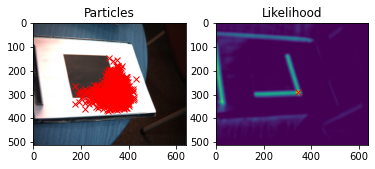

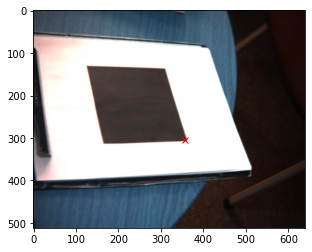

In [6]:
r_lr = HW2_Practical7c('lr')

We are matching this template with shape:  (28, 30)


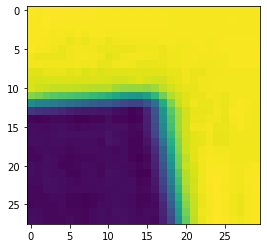

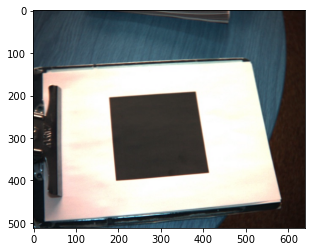

Processing Frame 0
[383.60295027 198.62233561]


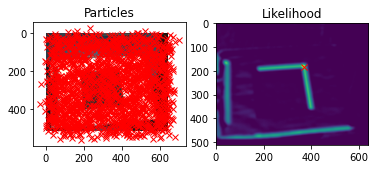

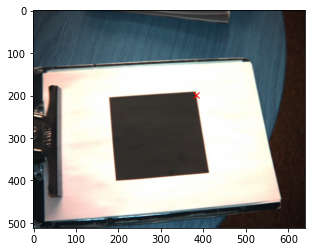

Processing Frame 1
[381.52137315 196.4488495 ]
Processing Frame 2
[381.46476465 197.86623795]
Processing Frame 3
[382.53988253 196.59891917]
Processing Frame 4
[384.82645057 199.38920104]
Processing Frame 5
[386.12592314 198.97914035]
Processing Frame 6
[389.29508834 199.79239837]
Processing Frame 7
[390.4431898  195.70374229]
Processing Frame 8
[390.55764908 197.64292329]
Processing Frame 9
[393.4198371  198.04784315]
Processing Frame 10
[391.05217642 199.0640609 ]


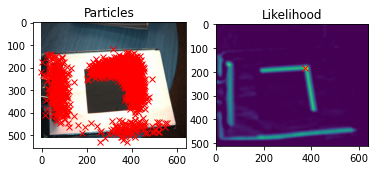

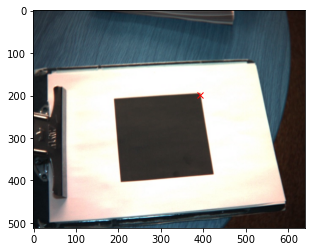

Processing Frame 11
[391.33792687 201.87594738]
Processing Frame 12
[391.47276766 201.60927244]
Processing Frame 13
[394.73792332 198.58674186]
Processing Frame 14
[397.60563457 188.57185205]
Processing Frame 15
[404.20024626 185.06023797]
Processing Frame 16
[409.76790585 180.22266296]
Processing Frame 17
[411.15161285 180.58183374]
Processing Frame 18
[415.54582887 180.64833004]
Processing Frame 19
[421.93776597 179.64247423]
Processing Frame 20
[423.59978895 183.72371961]


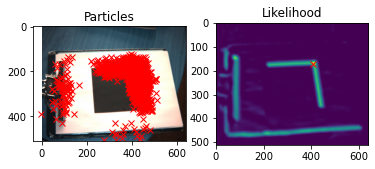

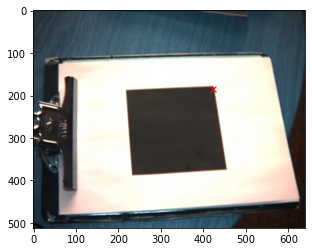

Processing Frame 21
[427.70442725 185.39725848]
Processing Frame 22
[430.56021195 191.12408428]
Processing Frame 23
[436.27642872 192.59593301]
Processing Frame 24
[440.75845968 191.73707892]
Processing Frame 25
[445.67962214 192.73881038]
Processing Frame 26
[451.22327149 191.38132247]
Processing Frame 27
[458.12195674 188.837858  ]
Processing Frame 28
[468.59052488 186.63921093]
Processing Frame 29
[474.66731027 186.43736269]
Processing Frame 30
[476.73084943 192.77238386]


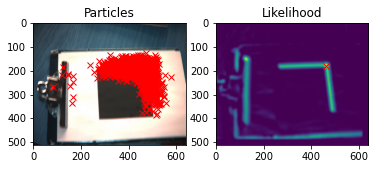

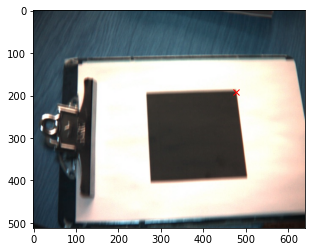

Processing Frame 31
[477.66991532 202.99817801]
Processing Frame 32
[474.97654063 207.70605131]
Processing Frame 33
[477.80460789 214.21136367]
Processing Frame 34
[473.07245242 217.09922714]
Processing Frame 35
[465.70116759 220.53651212]
Processing Frame 36
[458.42549366 218.47558103]
Processing Frame 37
[443.61003424 212.40891438]
Processing Frame 38
[425.13131263 208.18434528]
Processing Frame 39
[412.32424163 210.85980773]
Processing Frame 40
[397.84561367 220.55381415]


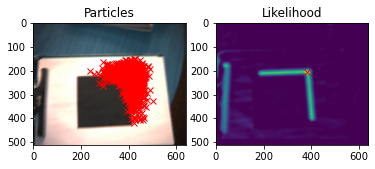

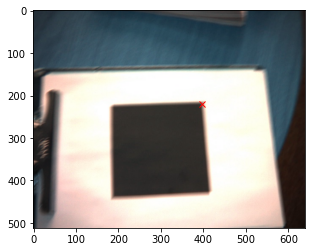

Processing Frame 41
[389.91803729 230.16273708]
Processing Frame 42
[385.26597998 237.95748365]
Processing Frame 43
[373.16343888 252.09413195]
Processing Frame 44
[370.95447726 262.52276728]
Processing Frame 45
[368.49100745 269.8826599 ]
Processing Frame 46
[369.06765815 272.63125344]
Processing Frame 47
[372.95957322 267.758991  ]
Processing Frame 48
[373.15011462 261.6627572 ]
Processing Frame 49
[374.59552218 252.42302197]
Processing Frame 50
[377.37511092 244.2647505 ]


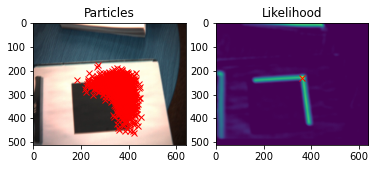

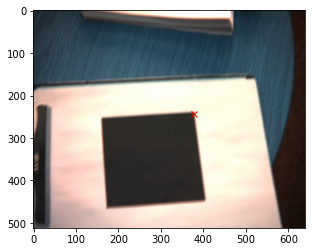

Processing Frame 51
[382.12832725 232.96002975]
Processing Frame 52
[381.00367429 232.39905294]
Processing Frame 53
[379.78141381 237.94655346]
Processing Frame 54
[378.40703748 240.17949046]
Processing Frame 55
[374.70039702 244.60902325]
Processing Frame 56
[373.55665196 242.15665627]
Processing Frame 57
[374.32808364 233.00876268]
Processing Frame 58
[373.56233327 222.1168241 ]
Processing Frame 59
[374.21276548 211.45813685]
Processing Frame 60
[375.22537024 197.04237343]


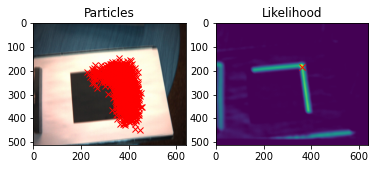

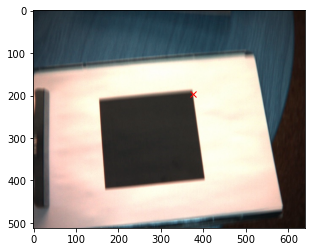

Processing Frame 61
[373.57950244 185.51593886]
Processing Frame 62
[371.45165632 180.94298924]
Processing Frame 63
[368.20721974 176.68542593]
Processing Frame 64
[370.51045624 176.26438926]
Processing Frame 65
[366.97690878 172.35749441]
Processing Frame 66
[370.16774182 170.99348168]
Processing Frame 67
[366.97649916 171.07266192]
Processing Frame 68
[366.39480956 167.26439294]
Processing Frame 69
[365.4946675  166.32029195]
Processing Frame 70
[364.8936679  162.03166468]


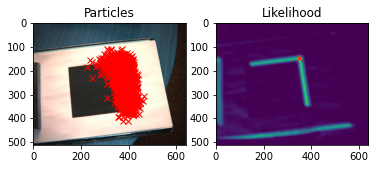

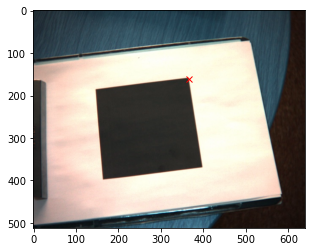

Processing Frame 71
[364.56791404 163.13759223]
Processing Frame 72
[364.00830573 159.25265473]
Processing Frame 73
[364.84261729 159.79087377]
Processing Frame 74
[368.55519837 162.64075599]
Processing Frame 75
[367.32415176 166.89165345]
Processing Frame 76
[375.96340624 169.58936118]
Processing Frame 77
[387.09926797 164.36623431]
Processing Frame 78
[402.26140381 157.99409218]
Processing Frame 79
[406.08426577 148.11668765]
Processing Frame 80
[411.17330342 139.81024775]


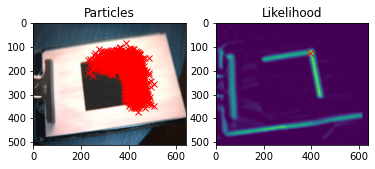

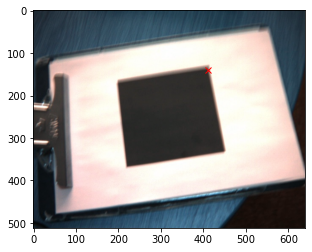

Processing Frame 81
[414.80734486 129.67412486]
Processing Frame 82
[415.30957807 125.76043156]
Processing Frame 83
[411.43783004 120.12685067]
Processing Frame 84
[413.47429867 117.70626646]
Processing Frame 85
[411.08708193 114.84393037]
Processing Frame 86
[407.15495319 116.31709263]
Processing Frame 87
[403.54999566 114.55338518]
Processing Frame 88
[400.68719999 113.06543616]
Processing Frame 89
[394.17266324 111.59430645]
Processing Frame 90
[392.76400136 109.04294759]


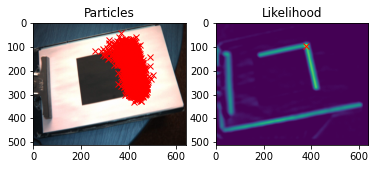

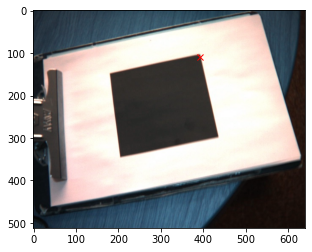

Processing Frame 91
[389.22930969 105.24227321]
Processing Frame 92
[390.29714687 107.69747456]
Processing Frame 93
[391.74007858 103.8866631 ]
Processing Frame 94
[391.49980438 100.58341483]
Processing Frame 95
[390.3624769   97.74600279]
Processing Frame 96
[388.64169749 101.58581075]
Processing Frame 97
[373.95674684 111.65547615]
Processing Frame 98
[365.41557096 116.85583152]
Processing Frame 99
[360.6294643  122.53221026]
Processing Frame 100
[354.5904042  137.20781676]


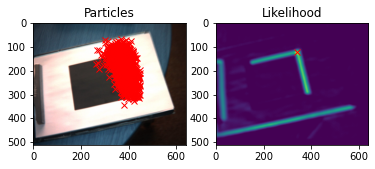

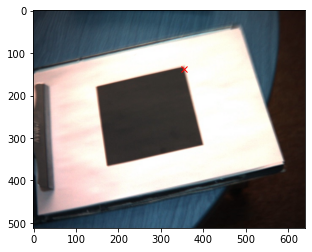

Processing Frame 101
[349.20157191 139.20818592]
Processing Frame 102
[346.14155229 143.53854236]
Processing Frame 103
[345.32865905 135.14176558]
Processing Frame 104
[346.22030565 131.61729319]
Processing Frame 105
[339.89801112 132.65647252]
Processing Frame 106
[340.6325726  123.67701311]
Processing Frame 107
[344.26020305 123.84817334]
Processing Frame 108
[339.41188929 123.38447048]
Processing Frame 109
[340.70140299 124.67784562]
Processing Frame 110
[333.9088769  125.80101134]


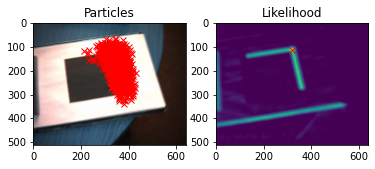

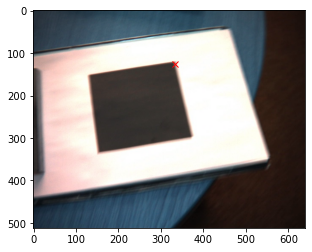

Processing Frame 111
[326.96475567 137.93117882]
Processing Frame 112
[320.89533721 147.74510113]
Processing Frame 113
[316.77708663 152.77884816]
Processing Frame 114
[320.25910535 154.03827807]
Processing Frame 115
[323.57369487 161.94278247]
Processing Frame 116
[326.2965689  161.79904389]
Processing Frame 117
[332.1539031 168.1334155]
Processing Frame 118
[335.37565784 169.82115828]
Processing Frame 119
[344.54092684 166.49789722]
Processing Frame 120
[353.69562174 169.66686797]


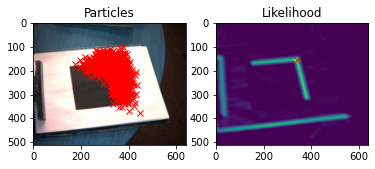

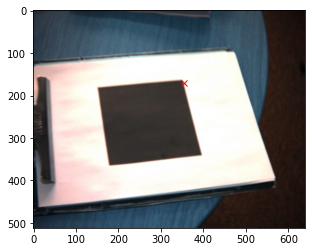

Processing Frame 121
[356.06381803 170.6772061 ]
Processing Frame 122
[357.28218208 167.93885901]
Processing Frame 123
[361.36870382 162.85232795]
Processing Frame 124
[356.2746136  166.13942622]
Processing Frame 125
[353.05082951 167.33153564]
Processing Frame 126
[358.10768353 165.26049535]
Processing Frame 127
[363.61077427 161.85250664]
Processing Frame 128
[364.83595404 164.85642103]
Processing Frame 129
[366.70423898 165.47336124]
Processing Frame 130
[364.61019192 172.94382805]


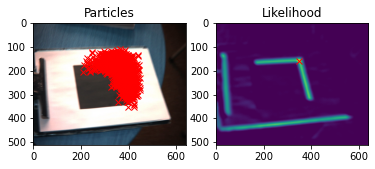

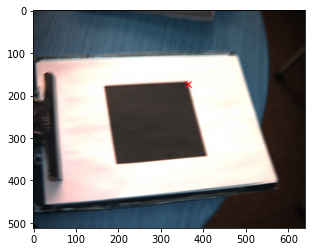

Processing Frame 131
[352.06663131 173.10281629]
Processing Frame 132
[344.11128135 163.75953726]
Processing Frame 133
[345.98334454 153.20932245]
Processing Frame 134
[342.41459042 148.311196  ]
Processing Frame 135
[342.93664675 143.32212634]
Processing Frame 136
[343.34490455 139.4104182 ]
Processing Frame 137
[344.23634789 133.52559235]
Processing Frame 138
[343.17113251 134.60986314]
Processing Frame 139
[349.01677471 133.59309738]
Processing Frame 140
[351.64040709 131.67097932]


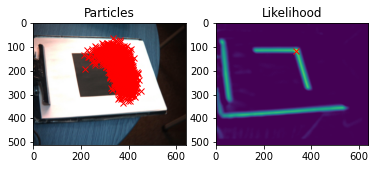

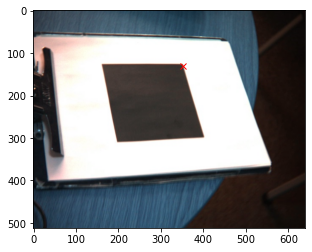

Processing Frame 141
[349.01966649 133.42217823]
Processing Frame 142
[347.69944418 132.90874332]
Processing Frame 143
[343.1606424  131.76690379]
Processing Frame 144
[335.02430504 135.7007375 ]
Processing Frame 145
[329.43345218 133.71272677]
Processing Frame 146
[322.94424249 127.55095283]
Processing Frame 147
[317.69970771 135.09239312]
Processing Frame 148
[310.39478723 138.57805908]
Processing Frame 149
[312.3506997  141.53354375]
Processing Frame 150
[308.7107844  140.03776568]


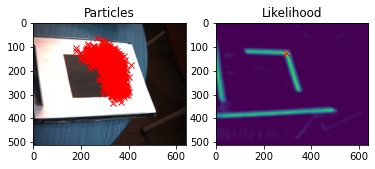

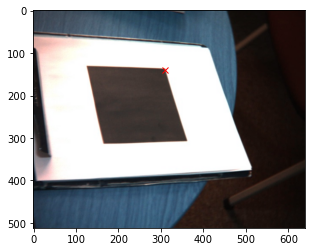

In [7]:
r_ur = HW2_Practical7c('ur')

As we can see the tracked corner(MAP value) tends to be very close to the actual corner but not a perfect match. Interestingly enough, there seems to be high likelihood values around the bottom of the paper clipboard and around the clip holding the paper, probably due to both being black strips next to white pixels leading to a high similarity with the patch we're looking for. This doesn't seem to be too much of a problem as the particles seem concentrated around the edges forming the corner we're trying to track.